Tutorials of CPS using HBC dataset
===
**Interpretations of attention scores**
1. read the dataset
2. construct the graph (construct the multi-scale features, option)
2. train the model
3. generate the arbitrary resolution spots
4. visualize the results

In [1]:
import os,sys
sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..')))
import warnings
warnings.filterwarnings("ignore")

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import CPS

In [3]:
opt = CPS.config()
args = opt.parse_args(['--seed', '2025'])
args.prep_scale = False
args.dataset_path = '/mnt/d/Dataset/SRT_Dataset/4-Human_Breast_Cancer'
args.radius=300
args.max_neighbors=6
args.clusters=20
args.hvgs=2000
args.sigma=1
args.freq=32
CPS.set_random_seed(args.seed)
args.k_list = [0,1,2,3,4,5,6,7]
args

Namespace(batch_size=256, clusters=20, coord_dim=2, dataset_path='/mnt/d/Dataset/SRT_Dataset/4-Human_Breast_Cancer', decoder_latent=[256, 512, 1024], distill=1.0, dropout=0.2, er_w=0.05, flow='source_to_target', freq=32, gpu=0, hvgs=2000, inr_latent=[256, 256, 256], k_list=[0, 1, 2, 3, 4, 5, 6, 7], latent_dim=64, lr=0.001, max_epoch=1000, max_neighbors=6, n_spot=0, num_heads=4, prep_scale=False, radius=300, seed=2025, self_loops=True, sigma=1, weight_decay=0.0001)

Read the adata

In [4]:
adata = sc.read_visium(path=args.dataset_path, count_file='filtered_feature_bc_matrix.h5')
Ann_df = pd.read_csv(os.path.join(args.dataset_path, 'metadata.tsv'), sep='\t', header=0, index_col=0)
adata.obs['Ground Truth'] = Ann_df.loc[adata.obs_names, 'ground_truth']
adata

AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Preprocess adata

In [5]:
adata.var_names_make_unique()
adata.layers["counts"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=args.hvgs)
adata_hvg = adata[:, adata.var['highly_variable']].copy()
sc.pp.normalize_total(adata_hvg, target_sum=1e4)
sc.pp.log1p(adata_hvg)
sc.pp.scale(adata_hvg, zero_center=True, max_value=10)

counts_layer = adata_hvg.layers['counts']
adata_hvg.obsm['hvg_features'] = adata_hvg.X
adata_hvg.obsm['hvg_counts'] = counts_layer.toarray()

Construct the spatial graph

In [6]:
spatial_edge = CPS.SpatialGraphBuilder(args)
pyg_data = spatial_edge.build_single_graph(adata_hvg, method='rknn')
print(pyg_data.num_nodes, pyg_data.num_genes, pyg_data.edge_index.shape)

3798 2000 torch.Size([2, 25862])


Train the CPS model

In [7]:
cps_model = CPS.CPSTrainer(args)
cps_model.fit(pyg_data, print_every=100)

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch   0: Train[Total:6.2965, T:2.9336, S:2.5970, D:0.7659]

Epoch 100: Train[Total:2.6150, T:1.0417, S:1.0523, D:0.5211]

Epoch 200: Train[Total:2.4185, T:1.0126, S:1.0227, D:0.3832]

Epoch 300: Train[Total:2.3138, T:0.9989, S:1.0079, D:0.3069]

Epoch 400: Train[Total:2.2360, T:0.9887, S:0.9981, D:0.2492]

Epoch 500: Train[Total:2.1592, T:0.9803, S:0.9898, D:0.1891]

Epoch 600: Train[Total:2.0948, T:0.9734, S:0.9828, D:0.1386]

Epoch 700: Train[Total:2.0471, T:0.9677, S:0.9775, D:0.1019]

Epoch 800: Train[Total:2.0074, T:0.9625, S:0.9722, D:0.0727]

Epoch 900: Train[Total:1.9824, T:0.9588, S:0.9688, D:0.0548]

Epoch 999: Train[Total:1.9616, T:0.9561, S:0.9652, D:0.0404]


Downstream analysis

In [8]:
# get the latent space
z_t, z_s, attn = cps_model.interpret_attn_scores(pyg_data)
adata_hvg.obsm['z_t'] = z_t
adata_hvg.obsm['z_s'] = z_s
adata_hvg.obsm['attns'] = attn
adata_hvg.obsm['attn_flat'] = attn.reshape(adata_hvg.n_obs, len(args.k_list)*args.num_heads)

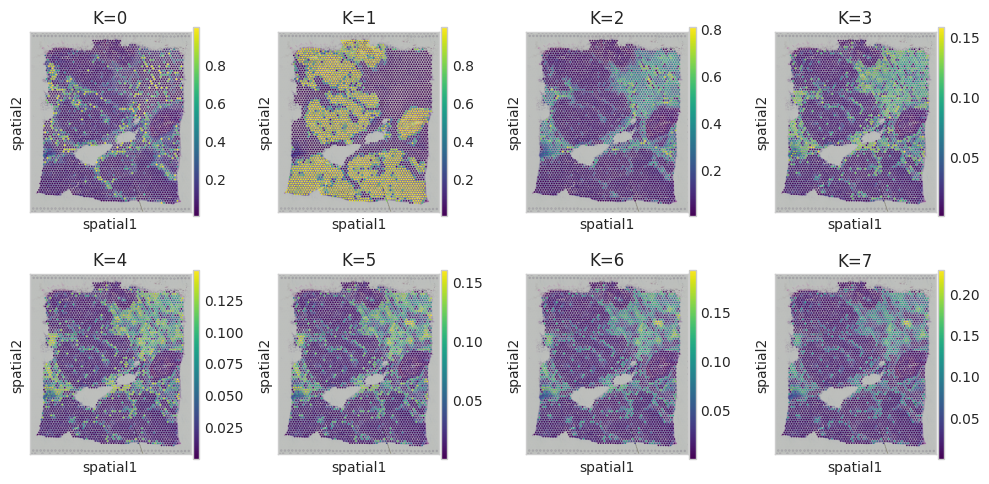

In [9]:
# show the average attention scores of multiple scales
attn_avg_heads = attn.mean(axis=-1)
for i, k in enumerate(args.k_list):
    adata.obs[f'attn_scale_{k}'] = attn_avg_heads[:, i]
    
fig, axes = plt.subplots(2, 4, figsize=(10, 5))
axes_flat = axes.flatten()

for i, (k, ax) in enumerate(zip(args.k_list, axes_flat)):
    if i < len(args.k_list):
        sc.pl.spatial(
            adata, 
            color=[f'attn_scale_{k}'],
            show=False,
            ax=ax,
            title=f"K={k}",
            cmap='viridis',
        )
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()


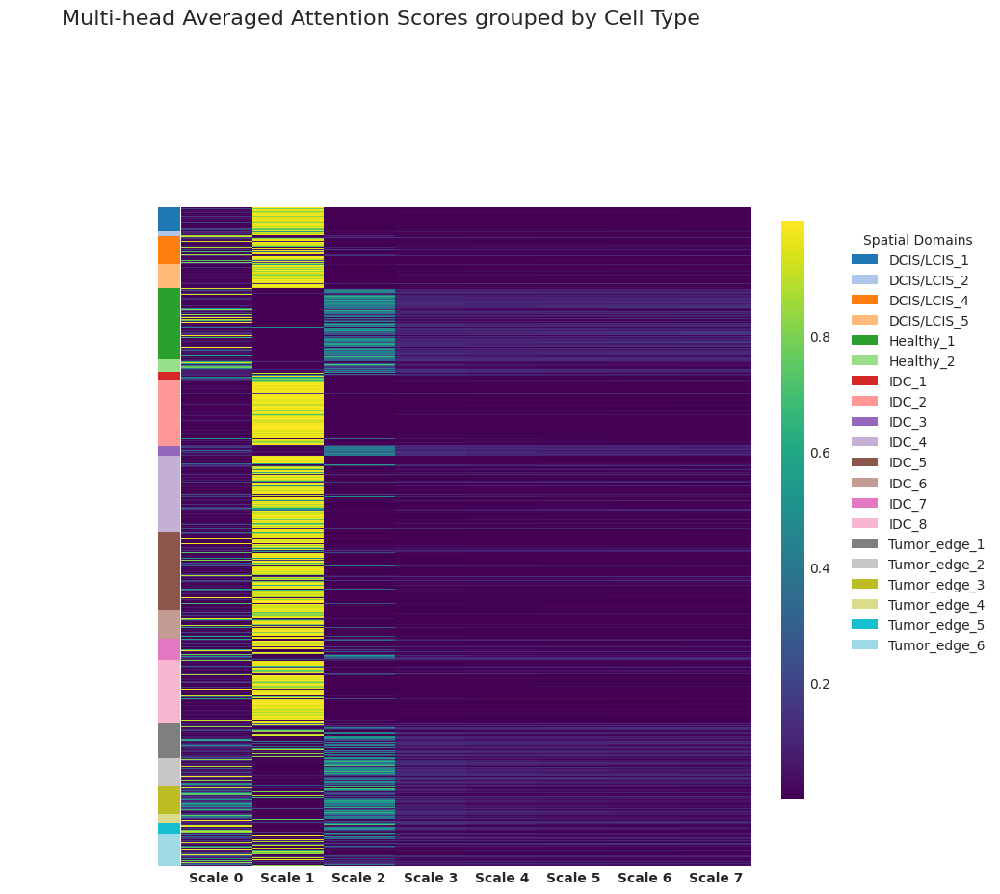

In [10]:
# show the attention scores of different spatial domains
attn_scores = adata_hvg.obsm['attns']
attn_avg = attn_scores.mean(axis=2)

df_plot = pd.DataFrame(
    attn_avg, 
    columns=[f'Scale {k}' for k in range(attn_avg.shape[1])]
)
df_plot['spatial domains'] = adata_hvg.obs['Ground Truth'].values
df_sorted = df_plot.sort_values('spatial domains')

# attention scores
data_heatmap = df_sorted.drop(columns=['spatial domains'])
labels = df_sorted['spatial domains']

unique_labels = labels.unique()
n_labels = len(unique_labels)
palette = sns.color_palette("tab20", n_labels)
lut = dict(zip(unique_labels, palette))
row_colors = labels.astype(object).map(lut)

g = sns.clustermap(
    data_heatmap,
    row_colors=row_colors, 
    row_cluster=False,   
    col_cluster=False,   
    cmap='viridis',     
    yticklabels=False,    
    xticklabels=True,     
    figsize=(8, 10),    
    cbar_pos=(1.02, 0.2, 0.03, 0.6) 
)

g.ax_row_colors.set_xlabel('')
g.ax_row_colors.set_xticklabels([])
g.ax_heatmap.set_ylabel('')
g.ax_row_colors.set_xticks([])
g.ax_heatmap.tick_params(axis='x', length=0)
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=0, fontsize=10, fontweight='bold')
g.fig.suptitle('Multi-head Averaged Attention Scores grouped by Cell Type', 
               y=1.02, fontsize=16)
from matplotlib.patches import Patch
handles = [Patch(facecolor=lut[name]) for name in lut]
plt.legend(handles, lut, title='Spatial Domains', bbox_to_anchor=(2.5, 1), loc='upper left')

plt.show()

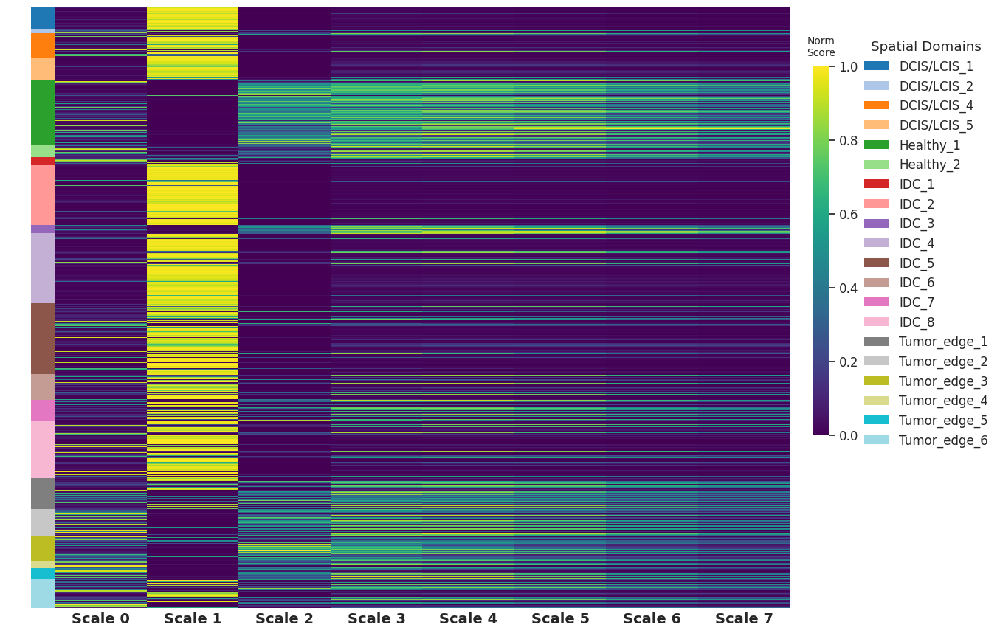

In [11]:
# relative attention scores
from matplotlib.patches import Patch
data_heatmap = df_sorted.drop(columns=['spatial domains'])
labels = df_sorted['spatial domains']

unique_labels = labels.unique()
palette = sns.color_palette("tab20", len(unique_labels))
lut = dict(zip(unique_labels, palette))
row_colors = labels.astype(object).map(lut)

sns.set_context("notebook", font_scale=1.1)

g = sns.clustermap(
    data_heatmap,
    row_colors=row_colors,
    row_cluster=False,
    col_cluster=False,

    standard_scale=1,
    cmap='viridis',    
    yticklabels=False,    
    xticklabels=True,     
    figsize=(11, 10),    
    cbar_pos=(1.01, 0.4, 0.02, 0.5),
    dendrogram_ratio=(0.03, 0.0) 
)

g.ax_row_colors.set_xlabel('')
g.ax_row_colors.set_xticklabels([])
g.ax_row_colors.set_xticks([])
g.ax_row_colors.tick_params(bottom=False)

g.ax_heatmap.tick_params(axis='x', length=0)
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=0, fontsize=14, fontweight='bold')
g.ax_heatmap.set_ylabel('')

# g.fig.suptitle('Multi-head Averaged Attention Scores grouped by Cell Type', 
#                y=1.02, fontsize=18)

handles = [Patch(facecolor=lut[name]) for name in unique_labels]

plt.legend(handles, lut, title='Spatial Domains', bbox_to_anchor=(2.5, 1.1), loc='upper left')
g.cax.set_title("Norm\nScore", fontsize=10, pad=10)

plt.show()

In [12]:
adata.obs['Ground Truth'].value_counts()

IDC_5           449
IDC_4           442
Healthy_1       411
IDC_2           383
IDC_8           364
Tumor_edge_1    198
Tumor_edge_6    182
Tumor_edge_2    165
IDC_6           163
DCIS/LCIS_4     161
Tumor_edge_3    159
DCIS/LCIS_5     139
DCIS/LCIS_1     135
IDC_7           127
Healthy_2        74
Tumor_edge_5     69
IDC_3            53
Tumor_edge_4     50
IDC_1            46
DCIS/LCIS_2      28
Name: Ground Truth, dtype: int64

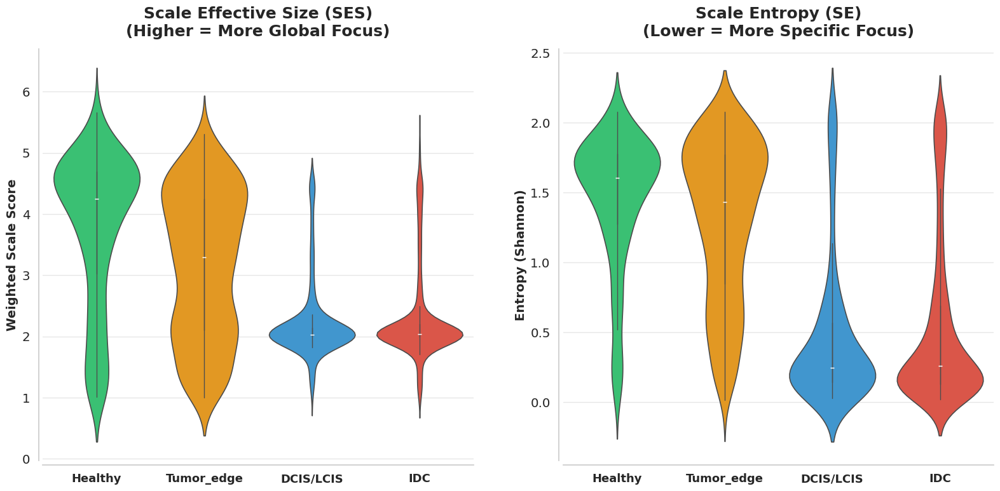

In [13]:
df_obs = adata_hvg.obs.copy()

def map_group(label):
    if str(label).startswith('IDC'): return 'IDC'
    elif str(label).startswith('DCIS') or str(label).startswith('LCIS'): return 'DCIS/LCIS'
    elif str(label).startswith('Tumor_edge'): return 'Tumor_edge'
    elif str(label).startswith('Healthy'): return 'Healthy'
    else: return 'Other'

df_obs['Group'] = df_obs['Ground Truth'].apply(map_group)

epsilon = 1e-10
attn_avg = adata_hvg.obsm['attns'].mean(axis=-1)
attn = attn_avg + epsilon
attn = attn / attn.sum(axis=1, keepdims=True)
weights = np.arange(1, 9)
df_obs['SES'] = attn @ weights
df_obs['SE'] = -np.sum(attn * np.log(attn), axis=1)


sns.set_theme(style="whitegrid", rc={"axes.grid.axis": "y", "grid.color": ".9", "grid.linewidth": 0.8})
sns.set_context("notebook", font_scale=1.3)

custom_palette = ["#2ecc71", "#f39c12", "#3498db", "#e74c3c"]
order = ['Healthy', 'Tumor_edge', 'DCIS/LCIS', 'IDC']

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=False)

violin_params = {
    "x": "Group",
    "order": order,
    "palette": custom_palette,
    "inner": "box",       
    "linewidth": 1.2,     
    "saturation": 0.85, 
    "width": 0.8,
}

sns.violinplot(data=df_obs, y='SES', ax=axes[0], **violin_params)
axes[0].set_title('Scale Effective Size (SES)\n(Higher = More Global Focus)', fontsize=18, fontweight='bold', pad=15)
axes[0].set_ylabel('Weighted Scale Score', fontsize=14, fontweight='bold')
axes[0].set_xlabel('')

sns.violinplot(data=df_obs, y='SE', ax=axes[1], **violin_params)
axes[1].set_title('Scale Entropy (SE)\n(Lower = More Specific Focus)', fontsize=18, fontweight='bold', pad=15)
axes[1].set_ylabel('Entropy (Shannon)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('')

for ax in axes:
    sns.despine(ax=ax, offset=5, trim=False) 
    plt.setp(ax.get_xticklabels(), fontweight='bold', fontsize=13)

    for artist in ax.lines:
        artist.set_color('.3')
        artist.set_linewidth(1)

plt.tight_layout(w_pad=3)
plt.show()

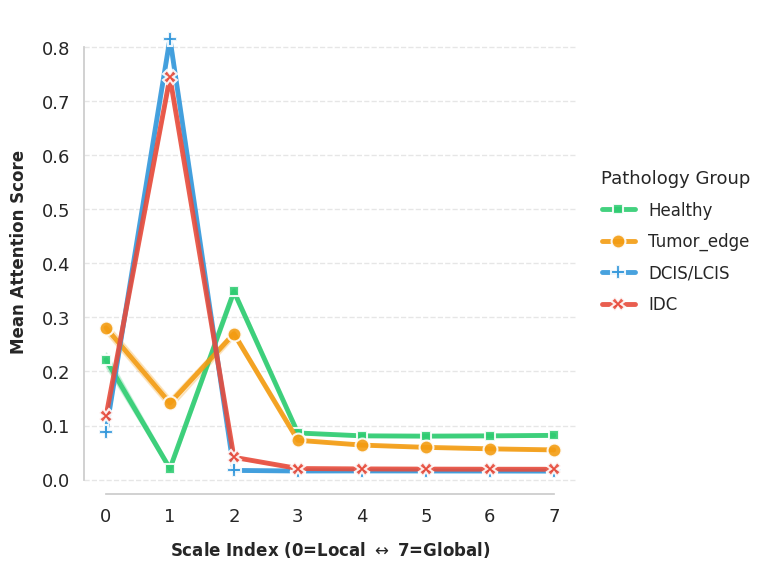

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

df_trend_raw = pd.DataFrame(attn_avg, columns=[i for i in range(8)]) 
df_trend_raw['Group'] = df_obs['Group'].values

df_long_raw = df_trend_raw.melt(
    id_vars='Group', 
    var_name='Scale', 
    value_name='Attention Score'
)

sns.set_theme(style="whitegrid", rc={"axes.grid": True, "grid.color": ".9", "grid.linestyle": "--"})
sns.set_context("notebook", font_scale=1.4) 

custom_palette = {
    "Healthy": "#2ecc71",     
    "Tumor_edge": "#f39c12",  
    "DCIS/LCIS": "#3498db",   
    "IDC": "#e74c3c"       
}
hue_order = ['Healthy', 'Tumor_edge', 'DCIS/LCIS', 'IDC']

plt.figure(figsize=(8,6))

ax = sns.lineplot(
    data=df_long_raw,
    x='Scale',
    y='Attention Score',
    hue='Group',
    hue_order=hue_order,
    palette=custom_palette,

    errorbar='se', 
    

    linewidth=3.5,     
    style='Group',       
    markers=True,          
    dashes=False,        
    markersize=10,     
    markeredgecolor='white',
    markeredgewidth=1.5,
    alpha=0.9          
)


# plt.title('Attention Scale Profile by Cell Type', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Scale Index (0=Local $\\leftrightarrow$ 7=Global)', fontsize=12, fontweight='bold', labelpad=10)
plt.ylabel('Mean Attention Score', fontsize=12, fontweight='bold', labelpad=10)

plt.xticks(range(8), fontsize=13)
plt.yticks(fontsize=13)

plt.legend(
    title='Pathology Group', 
    title_fontsize=13,
    fontsize=12,
    bbox_to_anchor=(1.02, 0.7), 
    loc='upper left', 
    frameon=False, 
    labelspacing=0.8
)

sns.despine(trim=True)

plt.tight_layout()
plt.show()

In [15]:
adata_hvg.obs['SES'] = df_obs['SES']
adata_hvg.obs['SE'] = df_obs['SE']

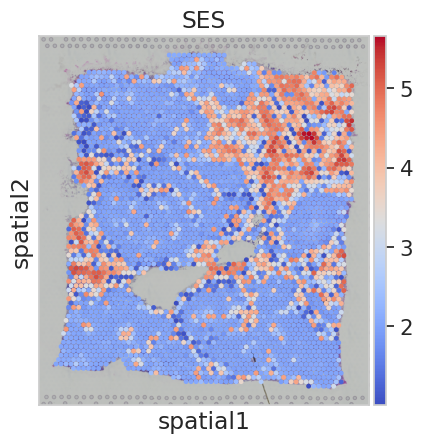

In [16]:
sc.pl.spatial(adata_hvg, color='SES', cmap='coolwarm',size=1.5)

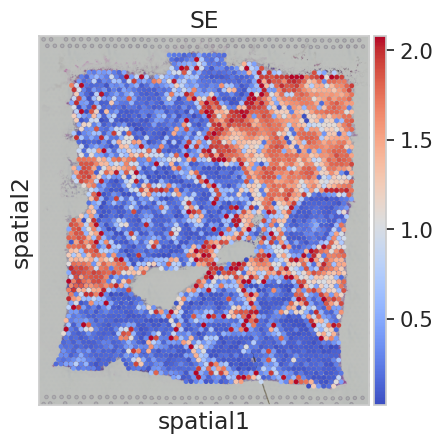

In [17]:
sc.pl.spatial(adata_hvg, color='SE', cmap='coolwarm',size=1.5)

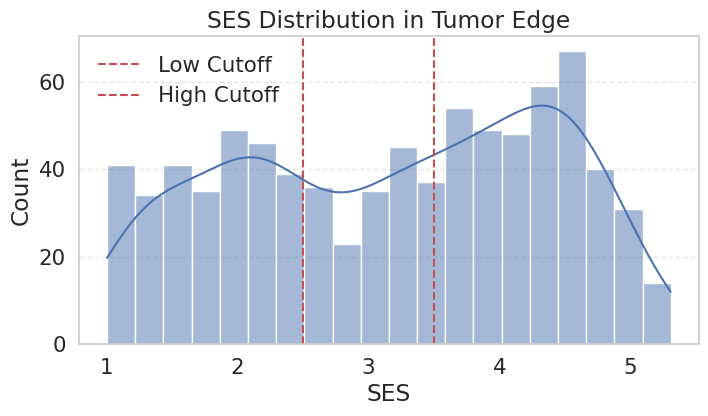

In [18]:
# Subsetting Tumor Edge and Grouping
subset_mask = adata_hvg.obs['Ground Truth'].str.startswith('Tumor_edge')
adata_edge = adata_hvg[subset_mask].copy()

plt.figure(figsize=(8, 4))
sns.histplot(adata_edge.obs['SES'], kde=True, bins=20)
plt.title("SES Distribution in Tumor Edge")
plt.axvline(2.5, color='r', linestyle='--', label='Low Cutoff')
plt.axvline(3.5, color='r', linestyle='--', label='High Cutoff')
plt.legend()
plt.show()

In [19]:
def robust_grouping(score):
    if score > 3.5:       #  (High SES)
        return 'High_Global_Attn'
    elif score < 2.5:     #  (Low SES)
        return 'Low_Local_Attn'
    else:
        return 'Intermediate'

adata_edge.obs['SES_Group'] = adata_edge.obs['SES'].apply(robust_grouping)

adata_final = adata_edge[adata_edge.obs['SES_Group'] != 'Intermediate'].copy()
print(f"Final cell counts for analysis:\n{adata_final.obs['SES_Group'].value_counts()}")

print("\n Differential Expression Analysis...")

sc.tl.rank_genes_groups(
    adata_final, 
    groupby='SES_Group', 
    groups=['High_Global_Attn'], 
    reference='Low_Local_Attn', 
    method='wilcoxon'
)

dedf = sc.get.rank_genes_groups_df(adata_final, group='High_Global_Attn')

top_genes = dedf[
    (dedf['pvals_adj'] < 0.05) & 
    (dedf['logfoldchanges'] > 0.5)
].sort_values('logfoldchanges', ascending=False)['names'].head(100).tolist()

print(f"Top 10 High-SES Markers: {top_genes[:10]}")

Final cell counts for analysis:
High_Global_Attn    370
Low_Local_Attn      284
Name: SES_Group, dtype: int64

 Differential Expression Analysis...
Top 10 High-SES Markers: ['MIDN', 'SNHG5', 'NDUFC1', 'EIF3L', 'ACOT13', 'GGCX', 'IGHM', 'NDUFB6', 'SLC7A2', 'SEC61G']


In [20]:
len(top_genes)

19

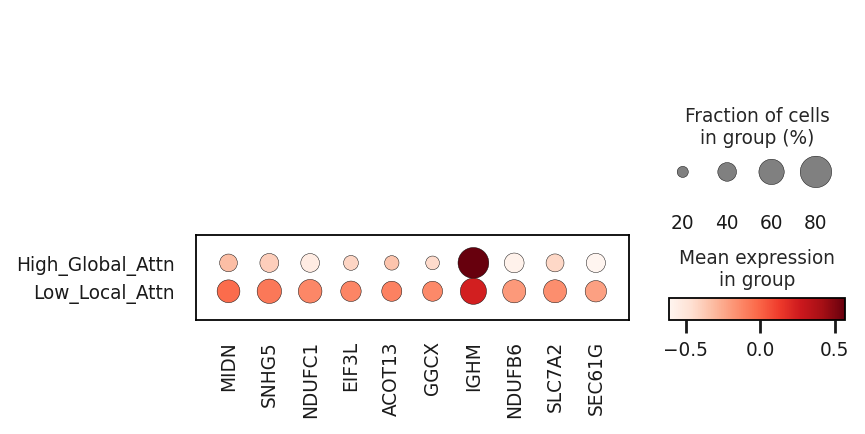

In [21]:
sc.set_figure_params(figsize=(8, 6), fontsize=10)
sc.pl.dotplot(adata_final, top_genes[:10], groupby='SES_Group', dendrogram=True)


 Pathway Enrichment Analysis...


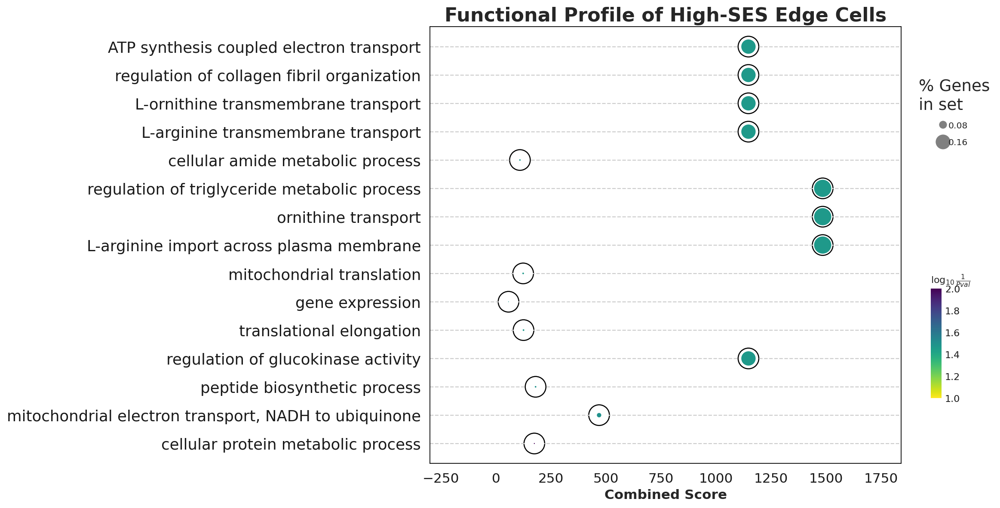

                                                 Term  Adjusted P-value  \
22                 regulation of glucokinase activity          0.034341   
14                           translational elongation          0.034341   
15                                    gene expression          0.034341   
16                          mitochondrial translation          0.034341   
17           L-arginine import across plasma membrane          0.034341   
18                                ornithine transport          0.034341   
19       regulation of triglyceride metabolic process          0.034341   
20                   cellular amide metabolic process          0.034341   
21                 L-arginine transmembrane transport          0.034341   
23                L-ornithine transmembrane transport          0.034341   
24         regulation of collagen fibril organization          0.034341   
25           ATP synthesis coupled electron transport          0.034341   
2   mitochondrial electro

In [22]:
import matplotlib.pyplot as plt
import gseapy as gp
from gseapy import dotplot

print("\n Pathway Enrichment Analysis...")

if top_genes:
    available_libs = gp.get_library_name()
    hallmark_lib = 'MSigDB_Hallmark_2020'
    if hallmark_lib not in available_libs:
        matches = [lib for lib in available_libs if 'Hallmark' in lib]
        hallmark_lib = matches[0] if matches else None
    
    gene_sets = ['GO_Biological_Process_2021']
    if hallmark_lib: gene_sets.append(hallmark_lib)

    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=gene_sets,
        organism='human', 
        outdir=None
    )

    results = enr.results
    sig_results = results[results['Adjusted P-value'] < 0.05].sort_values('Adjusted P-value')

    if not sig_results.empty:
        sig_results['Term'] = sig_results['Term'].str.replace(r' \(GO:\d+\)', '', regex=True)
        
        n_plot = 15  
        df_plot = sig_results.head(n_plot).copy()
        
        df_plot = df_plot.iloc[::-1]

        fig_height = max(6, n_plot * 0.5)
        
        ax = dotplot(
            df_plot,  
            title="Functional Profile of High-SES Edge Cells",
            x='Combined Score', 
            y='Term', 
            column="Adjusted P-value", 
            size=15, 
            top_term=n_plot, 
            cmap='viridis_r', 
            figsize=(15, fig_height), 
            show_ring=True
        )

        plt.tight_layout()
        plt.show()

        print(df_plot[['Term', 'Adjusted P-value', 'Combined Score']])
    else:
        print("No significant pathways found.")

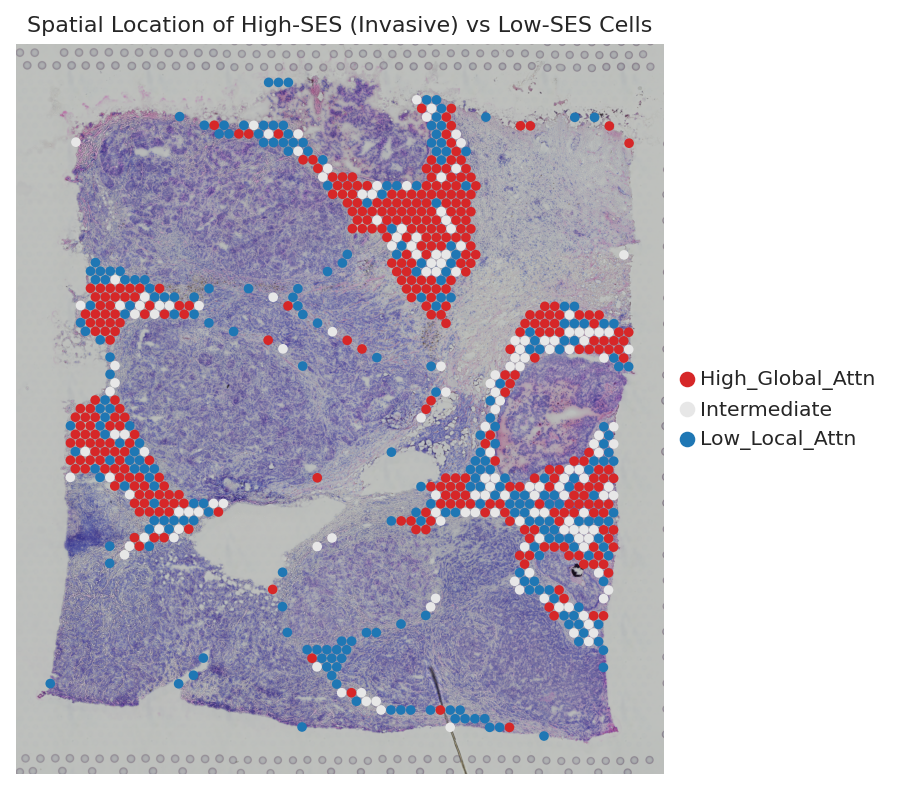

In [23]:
tumor_edge_sub = adata_hvg[adata_hvg.obs['Ground Truth'].str.contains('Tumor')].copy()
tumor_edge_sub.obs['Functional_Edge_Group'] = 'Intermediate' # 默认背景
tumor_edge_sub.obs.loc[adata_final.obs_names, 'Functional_Edge_Group'] = adata_final.obs['SES_Group']

palette = {
    "High_Global_Attn": "#d62728", 
    "Low_Local_Attn": "#1f77b4",   
    "Intermediate": "#e7e7e7"       
}
sc.pl.spatial(
    tumor_edge_sub, 
    img_key="hires", 
    color="Functional_Edge_Group",
    palette=palette,
    title="Spatial Location of High-SES (Invasive) vs Low-SES Cells",
    size=1.5,       
    alpha_img=1,
    frameon=False
)

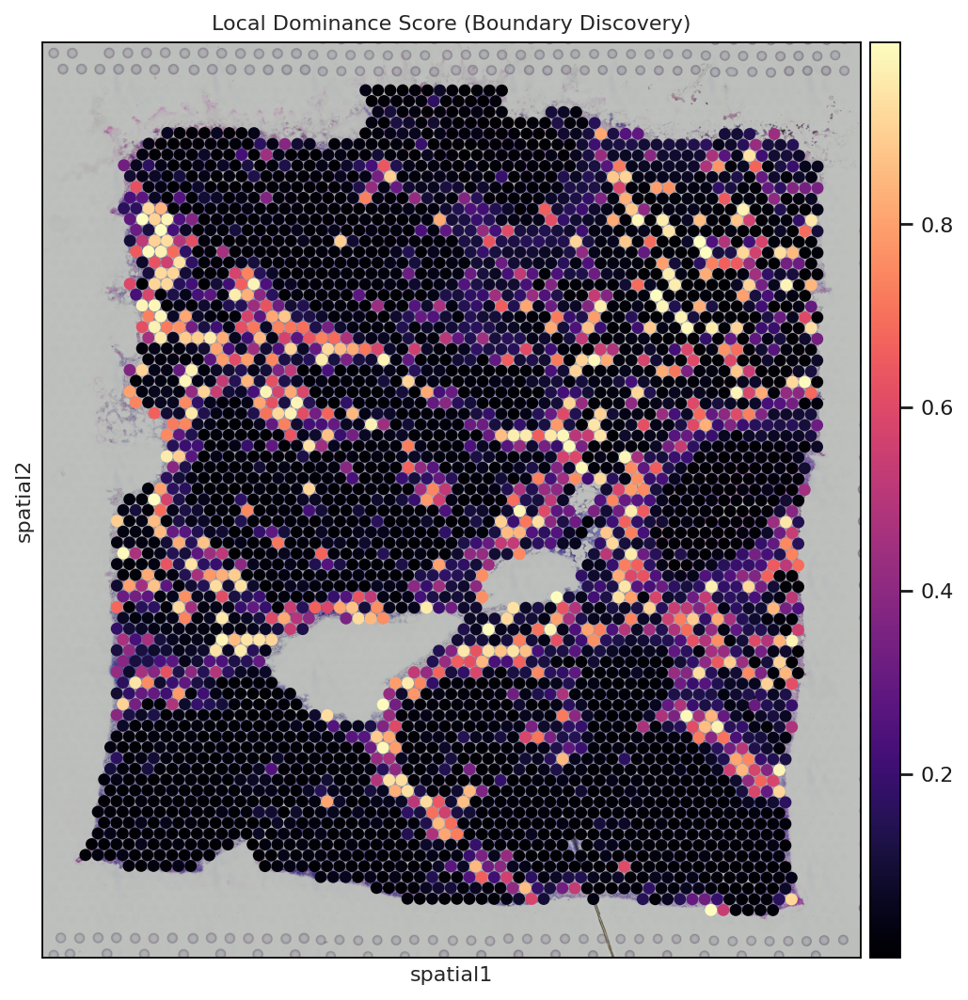

In [24]:
# Local Dominance
k_local_threshold = 1
local_attn_score = np.sum(attn[:, :k_local_threshold], axis=1)

adata.obs['Local_Dominance'] = local_attn_score
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.spatial(adata, 
              img_key="hires", 
              color='Local_Dominance', 
              cmap='magma', 
              size=1.5, 
              title='Local Dominance Score (Boundary Discovery)',
              ax=ax,
              show=False)

plt.show()

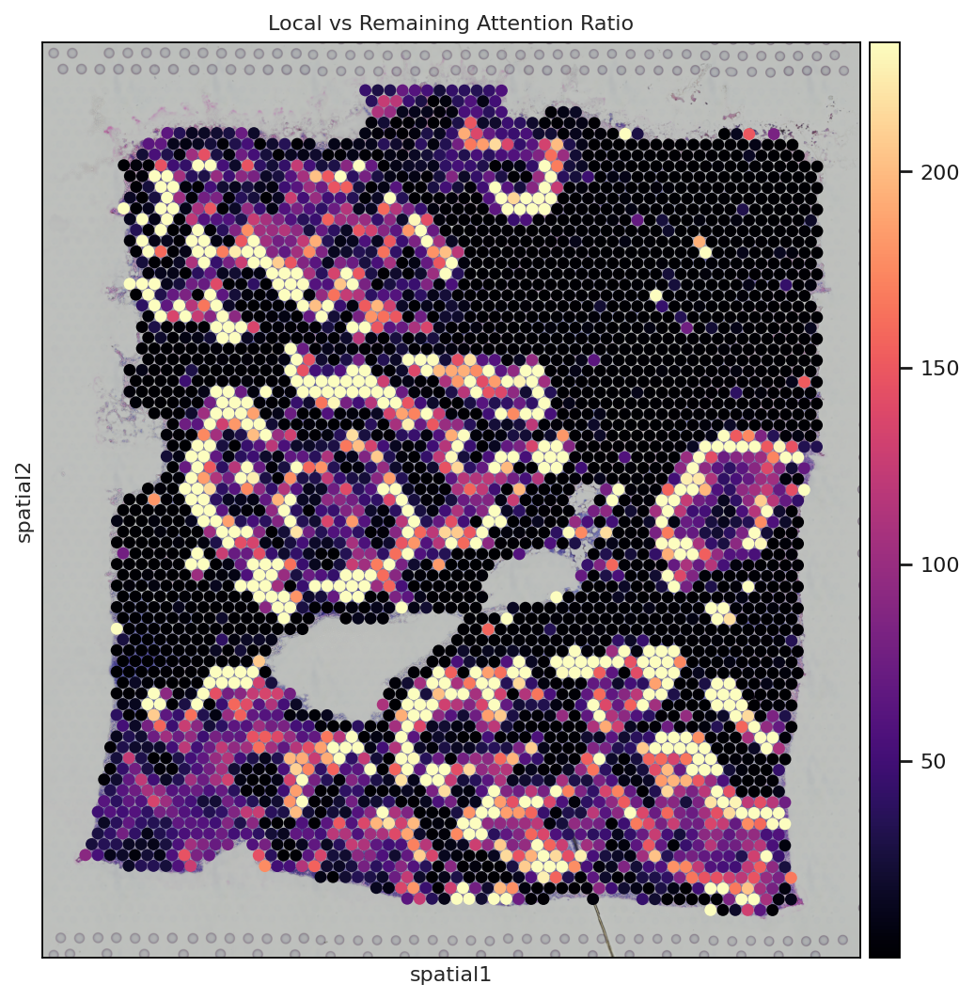

In [25]:
# Local-to-Remaining Ratio

k_local_threshold = 2

local_sum = np.sum(attn[:, :k_local_threshold], axis=1)
remaining_sum = np.sum(attn[:, k_local_threshold:], axis=1)
ratio_score = local_sum / (remaining_sum + 1e-6)

adata.obs['Local_Global_Ratio'] = ratio_score

fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.spatial(adata, 
              img_key="hires", 
              color='Local_Global_Ratio', 
              cmap='magma',
              size=1.5,
              vmax=np.percentile(ratio_score, 90), 
              title='Local vs Remaining Attention Ratio',
              ax=ax,
              show=False)

plt.show()

R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


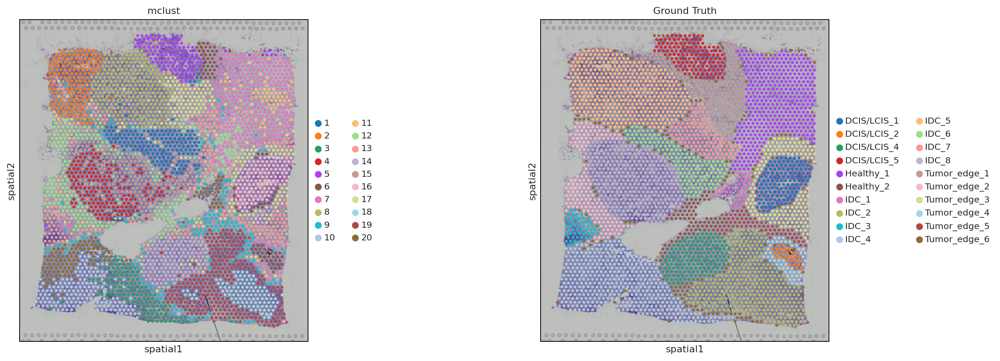

In [26]:
adata_hvg = CPS.mclust(adata_hvg, args, key='z_t', pca_dim=32)
sc.pl.spatial(adata_hvg, img_key="hires", color=["mclust",'Ground Truth'])

fitting ...
  |======================================================================| 100%


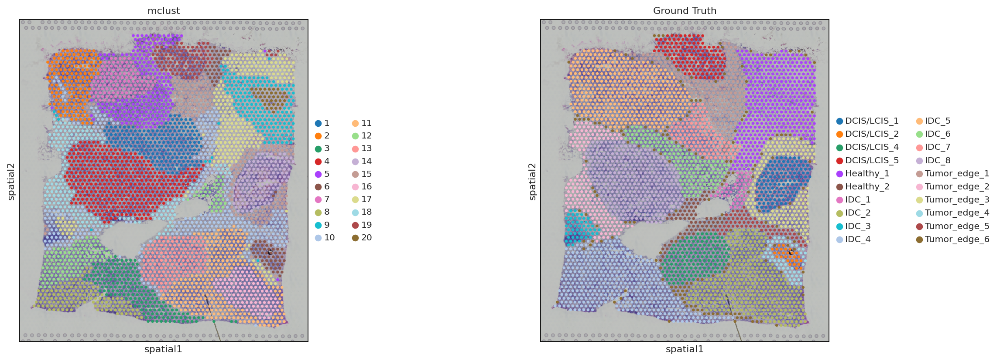

In [27]:
adata_hvg = CPS.mclust(adata_hvg, args, key='z_s', pca_dim=32)
sc.pl.spatial(adata_hvg, img_key="hires", color=["mclust",'Ground Truth'])

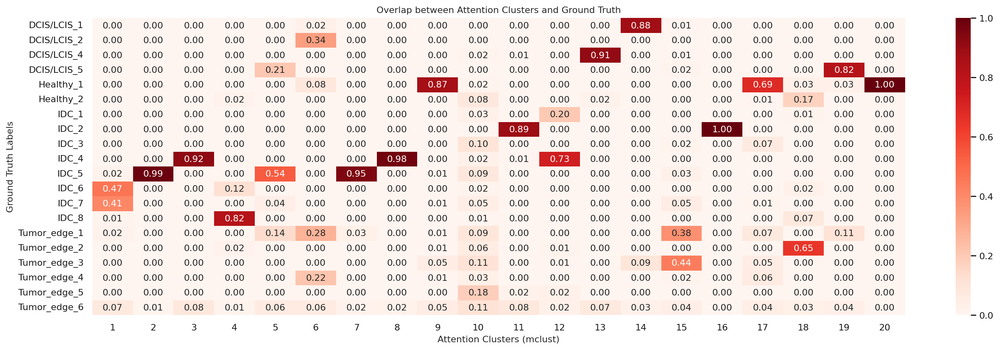

In [28]:
crosstab = pd.crosstab(adata_hvg.obs['Ground Truth'], adata_hvg.obs['mclust'])

crosstab_norm = crosstab.div(crosstab.sum(axis=0), axis=1)

plt.figure(figsize=(20, 6))
sns.heatmap(crosstab_norm, annot=True, fmt='.2f', cmap='Reds')
plt.title("Overlap between Attention Clusters and Ground Truth")
plt.xlabel("Attention Clusters (mclust)")
plt.ylabel("Ground Truth Labels")
plt.show()

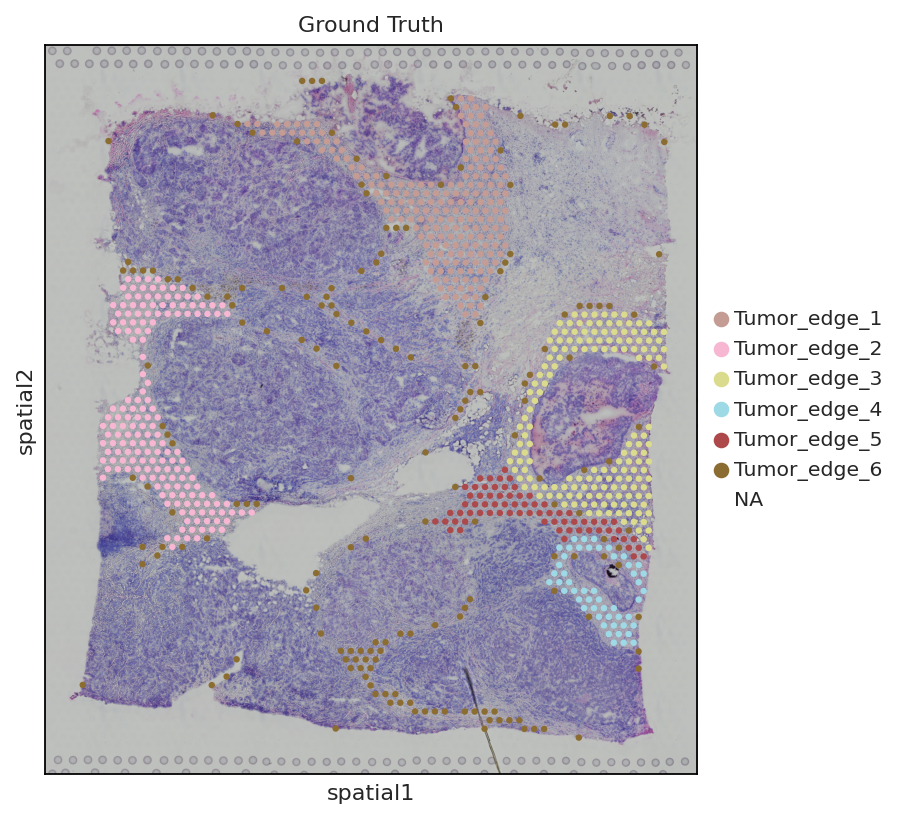

In [29]:
sc.pl.spatial(adata, 
              img_key="hires", 
              color=["Ground Truth"], 
              groups=['Tumor_edge_1', 'Tumor_edge_2', 'Tumor_edge_3',
                      'Tumor_edge_4', 'Tumor_edge_5', 'Tumor_edge_6'])